## Importing the Dependencies

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

## Data Loading and Understanding

In [207]:
df_delhi = pd.read_csv("Delhi_Hour_Data.csv") # Hourly AQI data of Delhi
df_kolkata = pd.read_csv("Kolkata_hour_data.csv") # Hourly AQI data of Kolkata
df_patna = pd.read_csv("Patna_hour_data.csv") # Hourly AQI data of Patna

In [5]:
# To get a quick overview of the data's structure
df_delhi.head()

,City,Datetime,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Delhi,01-01-2015 01:00,454.58,935.18,81.52,41.78,187.66,27.54,9.29,3.41,54.94,25.24,58.57,13.80,NaN,NaN
1,Delhi,01-01-2015 02:00,440.44,NaN,70.80,43.46,176.83,27.72,13.28,3.88,50.53,23.10,49.37,15.63,NaN,NaN
2,Delhi,01-01-2015 03:00,409.09,NaN,132.46,41.19,141.02,28.94,29.67,2.83,19.33,19.04,38.94,17.18,NaN,NaN
3,Delhi,01-01-2015 04:00,436.12,NaN,84.78,39.55,102.84,29.30,21.76,4.33,20.08,13.99,27.53,16.82,NaN,NaN
4,Delhi,01-01-2015 05:00,415.88,976.99,60.24,37.41,80.12,30.84,26.19,6.17,16.00,11.14,21.99,14.29,NaN,NaN


In [209]:
# Dropped the 'City' column as its of no use in case of modelling
df_delhi = df_delhi.drop(columns = ["City"])

In [9]:
df_delhi.head()

,Datetime,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,01-01-2015 01:00,454.58,935.18,81.52,41.78,187.66,27.54,9.29,3.41,54.94,25.24,58.57,13.80,NaN,NaN
1,01-01-2015 02:00,440.44,NaN,70.80,43.46,176.83,27.72,13.28,3.88,50.53,23.10,49.37,15.63,NaN,NaN
2,01-01-2015 03:00,409.09,NaN,132.46,41.19,141.02,28.94,29.67,2.83,19.33,19.04,38.94,17.18,NaN,NaN
3,01-01-2015 04:00,436.12,NaN,84.78,39.55,102.84,29.30,21.76,4.33,20.08,13.99,27.53,16.82,NaN,NaN
4,01-01-2015 05:00,415.88,976.99,60.24,37.41,80.12,30.84,26.19,6.17,16.00,11.14,21.99,14.29,NaN,NaN


In [11]:
# Returns a random sample of items from an axis of object
df_delhi.sample(5)

,Datetime,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
10608,18-03-2016 01:00,80.35,147.87,5.37,72.10,61.72,25.93,1.04,35.73,75.04,1.93,5.27,NaN,196.0,Moderate
23416,02-09-2017 17:00,NaN,2.99,20.94,24.11,9.01,NaN,0.44,NaN,25.11,0.12,0.00,NaN,88.0,Satisfactory
33328,20-10-2018 17:00,79.45,204.50,8.53,47.46,34.48,26.74,0.87,20.03,79.63,3.09,51.53,0.43,348.0,Very Poor
32250,05-09-2018 19:00,42.51,131.44,20.00,41.18,43.41,27.67,1.10,9.00,20.09,2.15,32.00,0.00,97.0,Satisfactory
33503,28-10-2018 00:00,268.33,472.87,155.92,72.61,176.15,53.49,4.65,17.65,35.79,15.84,114.26,4.93,412.0,Severe


In [7]:
# Returns a tuple representing the dimensions of the DataFrame
df_delhi.shape

(48192, 15)

In [15]:
# Prints information about a DataFrame including the index dtype and columns, non-null values and memory usage
df_delhi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48192 entries, 0 to 48191
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Datetime    48192 non-null  object 
 1   PM2.5       47817 non-null  float64
 2   PM10        45771 non-null  float64
 3   NO          47894 non-null  float64
 4   NO2         47862 non-null  float64
 5   NOx         48167 non-null  float64
 6   NH3         47212 non-null  float64
 7   CO          47828 non-null  float64
 8   SO2         45340 non-null  float64
 9   O3          45991 non-null  float64
 10  Benzene     48154 non-null  float64
 11  Toluene     48166 non-null  float64
 12  Xylene      29288 non-null  float64
 13  AQI         47694 non-null  float64
 14  AQI_Bucket  47694 non-null  object 
dtypes: float64(13), object(2)
memory usage: 5.5+ MB


### Initial Data Summary and Key Observations
1. The dataset contains 48,192 rows and 15 columns.
2. There are 13 numerical columns (float64) and 2 object columns (Datetime and AQI_Bucket).
3. The 'Datetime' column is stored as object and should be converted to datetime64 for time series analysis.
4. The 'Xylene' column has significant missing data (29,288 non-null entries), which may affect analysis.
5. Columns such as 'SO2', 'O3', 'NH3', 'PM10', and 'NO' also contain noticeable missing values.
6. The target variable 'AQI' and its categorical version 'AQI_Bucket' have 47,694 non-null entries, indicating around 500 missing rows.
7. Memory usage is approximately 5.5 MB, which is lightweight and manageable.
8. All numerical features are appropriately typed (float64) and ready for preprocessing and modeling.

In [17]:
df_delhi.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,47817.000000,45771.000000,47894.000000,47862.000000,48167.000000,47212.00000,47828.000000,45340.000000,45991.000000,48154.000000,48166.000000,29288.000000,47694.000000
mean,117.665396,233.114669,39.005350,50.763704,58.587961,42.12814,1.979092,15.927299,51.312347,3.546031,17.187459,1.443237,260.148048
std,95.203449,141.873206,50.193275,28.095322,48.902516,20.37413,2.943598,10.147007,34.261109,3.225829,18.466274,4.045554,121.521666
min,0.050000,2.990000,0.050000,2.660000,0.000000,0.57000,0.000000,0.020000,0.060000,0.000000,0.000000,0.000000,22.000000
25%,52.010000,125.205000,10.830000,30.200000,26.190000,29.85000,0.780000,9.640000,26.110000,1.500000,5.120000,0.070000,158.000000
50%,87.490000,204.500000,19.020000,44.260000,42.540000,37.43000,1.090000,13.380000,41.510000,2.590000,11.550000,0.350000,258.000000
75%,155.370000,313.630000,43.710000,64.770000,75.990000,48.90000,1.780000,19.340000,68.250000,4.580000,22.570000,1.652500,347.000000
max,938.500000,1000.000000,497.400000,337.820000,433.780000,485.52000,47.420000,187.050000,497.620000,93.340000,162.000000,158.830000,762.000000


### Statistical Summary and Descriptive Insights
1. Pollutants like PM2.5 and PM10 show a wide range (0 to over 900), indicating both clean and highly polluted days.
2. Max values in many columns (e.g., PM2.5, PM10, CO, NO, SO2) are significantly higher than their respective 75th percentiles, suggesting the presence of extreme outliers.
3. The AQI ranges from 0 to over 900, with a median (50th percentile) around 160–170, indicating that most days fall into the 'Moderate' to 'Poor' range.
4. Many pollutants have a mean > median, indicating right-skewed distributions. This is common in pollution data where extreme pollution spikes occasionally occur.
5. Several pollutants like NO, SO2, and NH3 have a minimum value of 0.0, suggesting either zero pollution readings or sensor/data issues on some days.
6. These VOCs (Volatile Organic Compounds) have comparatively low concentration ranges but still show variability. Xylene in particular may need attention due to its lower count and wide range.
7. Most variables are measured in micrograms per cubic meter (µg/m³) or mg/m³ and maintain decimal precision, suitable for modeling.

## Data Preprocessing

In [211]:
# Changing the datatype of the column 'Datetime'
df_delhi["Datetime"] = pd.to_datetime(df_delhi["Datetime"], format = "%d-%m-%Y %H:%M", errors='coerce')

In [11]:
# Calculates the total missing obs in each column
df_delhi.isnull().sum()

Datetime          0
PM2.5           375
PM10           2421
NO              298
NO2             330
NOx              25
NH3             980
CO              364
SO2            2852
O3             2201
Benzene          38
Toluene          26
Xylene        18904
AQI             498
AQI_Bucket      498
dtype: int64

In [23]:
# Calculates the total percentage of missing obs in each column
round((df_delhi.isnull().sum()/df_delhi.shape[0])*100, 2)

Datetime       0.00
PM2.5          0.78
PM10           5.02
NO             0.62
NO2            0.68
NOx            0.05
NH3            2.03
CO             0.76
SO2            5.92
O3             4.57
Benzene        0.08
Toluene        0.05
Xylene        39.23
AQI            1.03
AQI_Bucket     1.03
dtype: float64

Among all the pollutants, Xylene has the highest proportion of missing values, with nearly 39% of its data missing from the dataset.

<Axes: >

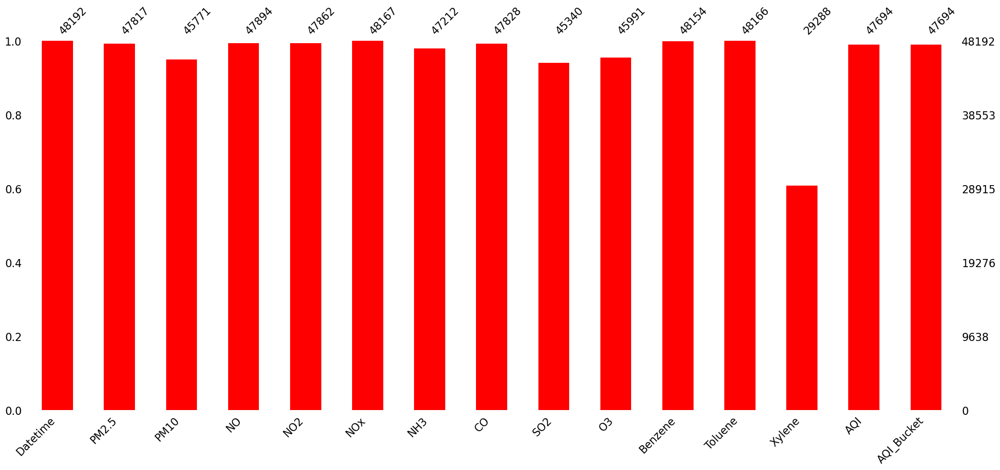

In [17]:
import missingno as msno
msno.bar(df_delhi, color = 'red')

In [13]:
# Compute the pairwise correlation between the Target variable and other feature variables
df_delhi.corr(numeric_only = True)["AQI"]

PM2.5      0.755772
PM10       0.750709
NO         0.408210
NO2        0.536661
NOx        0.407831
NH3        0.432759
CO         0.238780
SO2        0.318066
O3         0.259733
Benzene    0.484814
Toluene    0.218367
Xylene     0.128943
AQI        1.000000
Name: AQI, dtype: float64

**NOTE**: The correlation between Xylene and the target variable AQI is approximately 0.12, indicating a very weak linear relationship. Additionally, the Xylene column contains around 39% missing values, which can introduce noise and instability in modeling. Given its low predictive potential and high proportion of missing data, we are dropping the Xylene column from the dataset to streamline the model and avoid unnecessary imputation overhead.

In [213]:
# Dropping 'Xylene' column 
df_delhi = df_delhi.drop(columns = ["Xylene"])

### Imputing Missing Observations

In [215]:
# Imputation of missing values by linear interpolation method
df_delhi = df_delhi.interpolate(method='linear', limit_direction='both')

In [344]:
df_delhi.head()

,Datetime,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,AQI_Bucket
0,2015-01-01 01:00:00,454.58,935.1800,81.52,41.78,187.66,27.54,9.29,3.41,54.94,25.24,58.57,456.0,NaN
1,2015-01-01 02:00:00,440.44,945.6325,70.80,43.46,176.83,27.72,13.28,3.88,50.53,23.10,49.37,456.0,NaN
2,2015-01-01 03:00:00,409.09,956.0850,132.46,41.19,141.02,28.94,29.67,2.83,19.33,19.04,38.94,456.0,NaN
3,2015-01-01 04:00:00,436.12,966.5375,84.78,39.55,102.84,29.30,21.76,4.33,20.08,13.99,27.53,456.0,NaN
4,2015-01-01 05:00:00,415.88,976.9900,60.24,37.41,80.12,30.84,26.19,6.17,16.00,11.14,21.99,456.0,NaN


In [203]:
# Number of missing observations after imputation
df_delhi.isnull().sum()

Datetime        0
PM2.5           0
PM10            0
NO              0
NO2             0
NOx             0
NH3             0
CO              0
SO2             0
O3              0
Benzene         0
Toluene         0
AQI             0
AQI_Bucket    498
dtype: int64

**NOTE:** We have 498 missing values left in the AQI_Bucket column as it is a categorical column and interpolation only imputes in numerical columns. So we have to impute this manually with respect to the values of the column AQI.

Classification of AQI Bucket with respect to AQI:

If AQI > 0 and <= 50 --> AQI_Bucket = Good

else if AQI>= 51 and <=100 --> AQI_Bucket = Satisfactory

else if AQI>= 101 and <=200 --> AQI_Bucket = Moderate

else if AQI>= 201 and <= 300 --> AQI_Bucket = Poor

else if AQI>= 301 and <= 400 --> AQI_Bucket = Very Poor

else AQI_Bucket = Severe

In [217]:
# Function to fill the NaNs of AQI_Bucket 
def fill_aqi_bucket(row):
    if pd.isna(row['AQI_Bucket']):
        aqi = row['AQI']
        if 0 < aqi <= 50:
            return 'Good'
        elif 51 <= aqi <= 100:
            return 'Satisfactory'
        elif 101 <= aqi <= 200:
            return 'Moderate'
        elif 201 <= aqi <= 300:
            return 'Poor'
        elif 301 <= aqi <= 400:
            return 'Very Poor'
        else:
            return 'Severe'
    else:
        return row['AQI_Bucket']

# Apply the function row-wise
df_delhi['AQI_Bucket'] = df_delhi.apply(fill_aqi_bucket, axis=1)

In [272]:
df_delhi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48192 entries, 0 to 48191
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Datetime    48192 non-null  datetime64[ns]
 1   PM2.5       48192 non-null  float64       
 2   PM10        48192 non-null  float64       
 3   NO          48192 non-null  float64       
 4   NO2         48192 non-null  float64       
 5   NOx         48192 non-null  float64       
 6   NH3         48192 non-null  float64       
 7   CO          48192 non-null  float64       
 8   SO2         48192 non-null  float64       
 9   O3          48192 non-null  float64       
 10  Benzene     48192 non-null  float64       
 11  Toluene     48192 non-null  float64       
 12  AQI         48192 non-null  float64       
 13  AQI_Bucket  48192 non-null  object        
dtypes: datetime64[ns](1), float64(12), object(1)
memory usage: 5.1+ MB


**NOTE:** All missing values across the dataset have been successfully imputed, with special attention to the AQI_Bucket column, where missing entries were filled based on the corresponding AQI values using the standard categorization criteria.

## Exploratory Data Analysis (EDA)

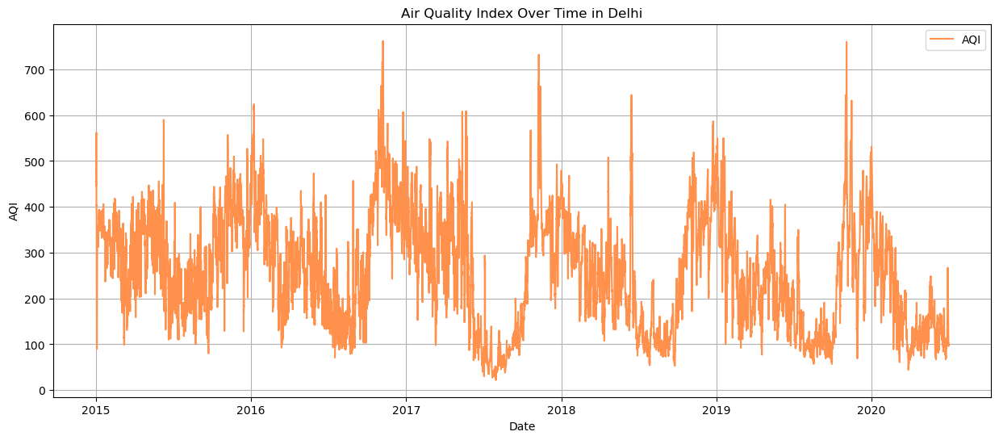

In [39]:
plt.figure(figsize = (15, 6))
plt.plot(df_delhi["Datetime"], df_delhi["AQI"], label = "AQI", color = '#FF914D')
plt.title('Air Quality Index Over Time in Delhi')
plt.xlabel('Date')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()

In [41]:
from statsmodels.tsa.seasonal import STL

# Perfrom STL decomposition
stl = STL(df_delhi["AQI"], period = 30)
result = stl.fit()

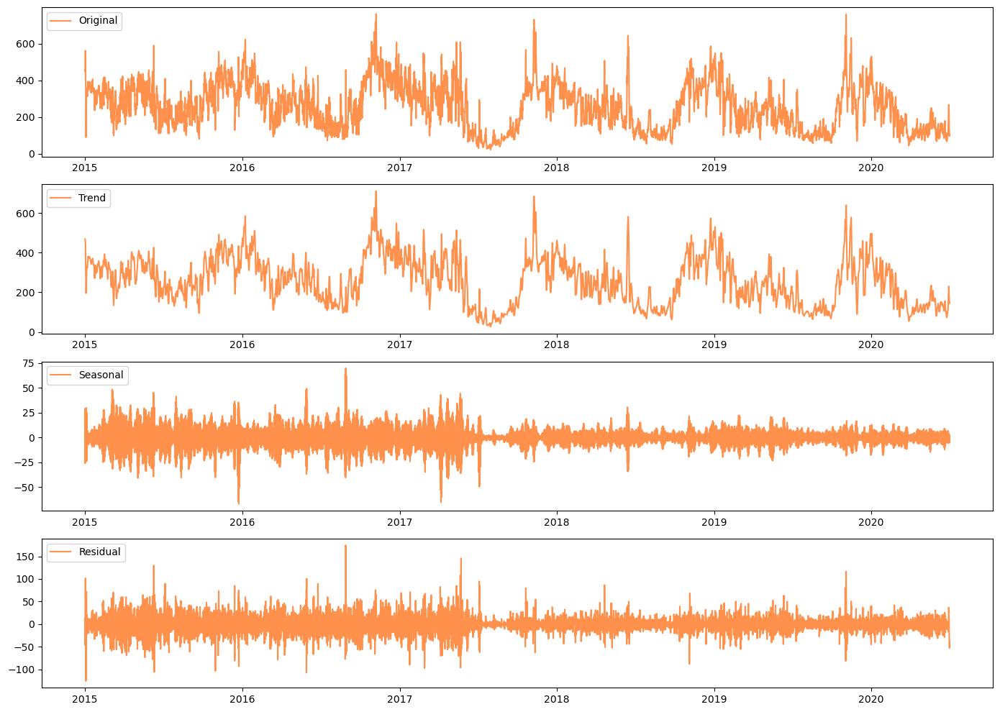

In [43]:
# Plot the decomposition components
plt.figure(figsize = (14,10))
plt.subplot(411)
plt.plot(df_delhi["Datetime"], result.observed, label = 'Original', color = '#FF914D')
plt.legend(loc = 'upper left')
plt.subplot(412)
plt.plot(df_delhi["Datetime"], result.trend, label = 'Trend', color = '#FF914D')
plt.legend(loc = 'upper left')
plt.subplot(413)
plt.plot(df_delhi["Datetime"], result.seasonal, label = 'Seasonal', color = '#FF914D')
plt.legend(loc = 'upper left')
plt.subplot(414)
plt.plot(df_delhi["Datetime"], result.resid, label = 'Residual', color = '#FF914D')
plt.legend(loc = 'upper left')
plt.tight_layout()
plt.show()

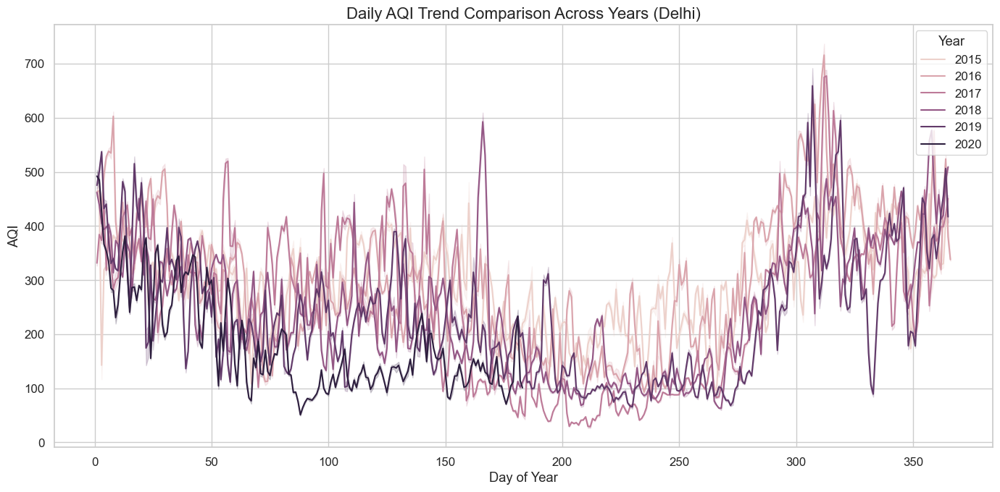

In [51]:
# Extract year and day-of-year
df_delhi['Year'] = df_delhi['Datetime'].dt.year
df_delhi['DayOfYear'] = df_delhi['Datetime'].dt.dayofyear

# Set up the plot
plt.figure(figsize=(14, 7))
sns.set(style='whitegrid', palette='Set2', font_scale=1.1)

# Plot: each year's AQI line
sns.lineplot(
    data=df_delhi,
    x='DayOfYear',
    y='AQI',
    hue='Year'
)

# Plot aesthetics
plt.title('Daily AQI Trend Comparison Across Years (Delhi)', fontsize=16)
plt.xlabel('Day of Year')
plt.ylabel('AQI')
plt.legend(title='Year', loc='upper right')
plt.tight_layout()
plt.show()

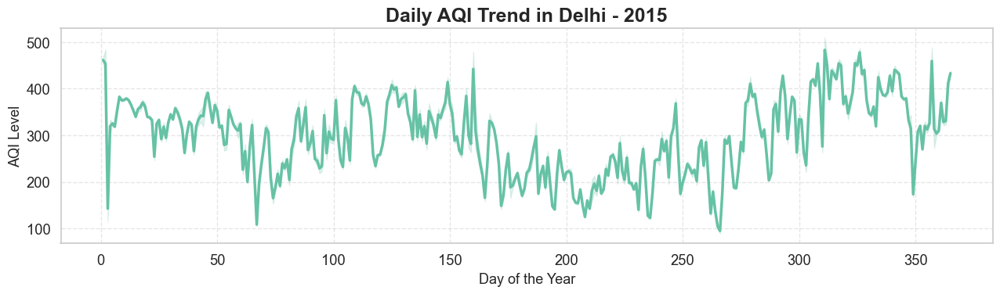

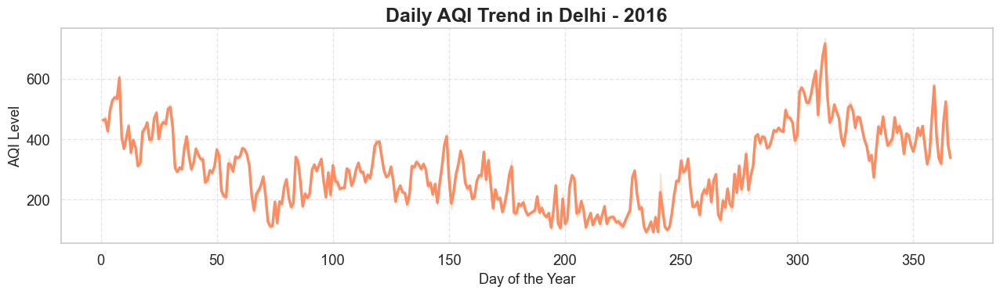

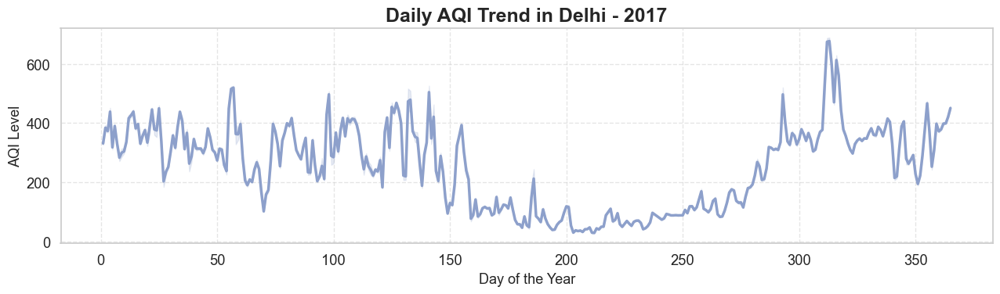

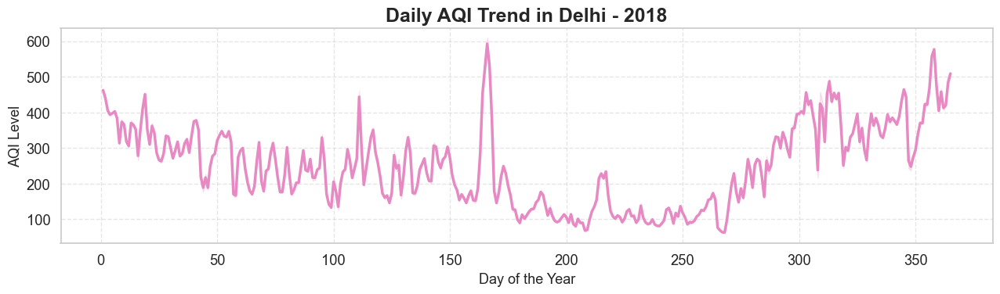

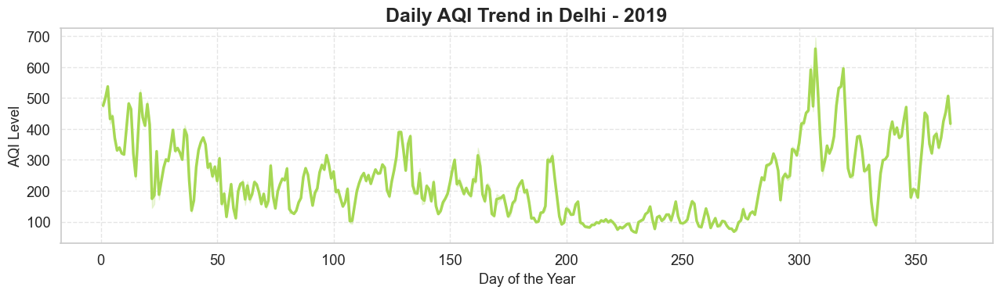

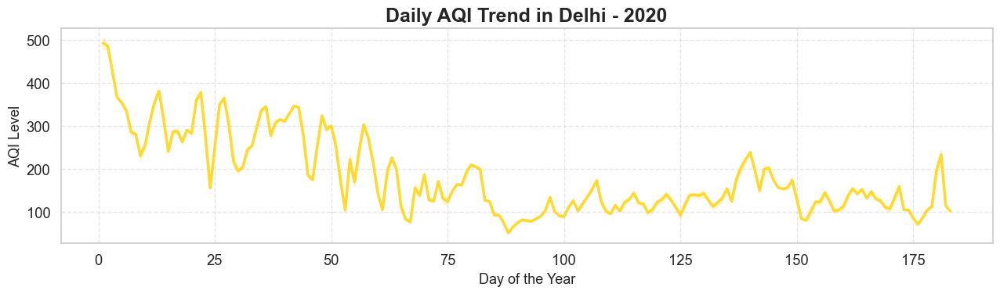

In [224]:
# Extract year and day-of-year
df_delhi['Year'] = df_delhi['Datetime'].dt.year
df_delhi['DayOfYear'] = df_delhi['Datetime'].dt.dayofyear

# Set seaborn style
sns.set(style='whitegrid', font_scale=1.2)
palette = sns.color_palette("Set2")

# Loop through each year and plot
unique_years = sorted(df_delhi['Year'].unique())

for i, year in enumerate(unique_years):
    plt.figure(figsize=(13, 4))
    year_data = df_delhi[df_delhi['Year'] == year]

    sns.lineplot(
        data=year_data,
        x='DayOfYear',
        y='AQI',
        color=palette[i % len(palette)],
        linewidth=2.5
    )

    plt.title(f'Daily AQI Trend in Delhi - {year}', fontsize=18, weight='bold')
    plt.xlabel('Day of the Year', fontsize=13)
    plt.ylabel('AQI Level', fontsize=13)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

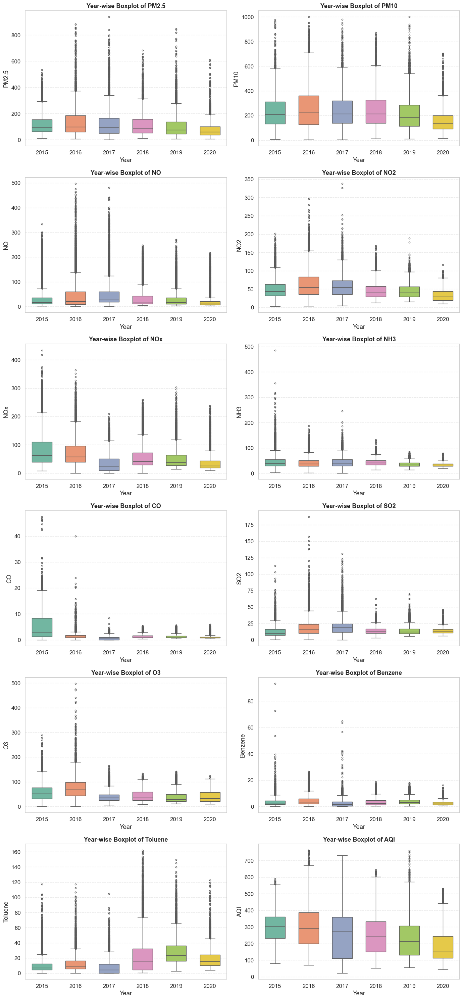

In [211]:
# Extract year from 'Datetime'
df_delhi['Year'] = pd.to_datetime(df_delhi['Datetime']).dt.year

# Get all numerical columns (excluding 'Year' if already exists)
numeric_cols = df_delhi.select_dtypes(include='number').columns.tolist()
numeric_cols = [col for col in numeric_cols if col != 'Year']

# Set up seaborn theme
sns.set(style="whitegrid", font_scale=1.1)

# Define subplot layout
n_cols = 2
n_rows = int(np.ceil(len(numeric_cols) / n_cols))

# Create subplots
plt.figure(figsize=(14, n_rows * 5))

for idx, col in enumerate(numeric_cols, 1):
    plt.subplot(n_rows, n_cols, idx)
    sns.boxplot(x='Year', y=col, data=df_delhi, palette='Set2', width=0.6, fliersize=3)
    plt.title(f'Year-wise Boxplot of {col}', fontsize=13, weight='bold')
    plt.xlabel('Year')
    plt.ylabel(col)
    plt.grid(axis='y', linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()

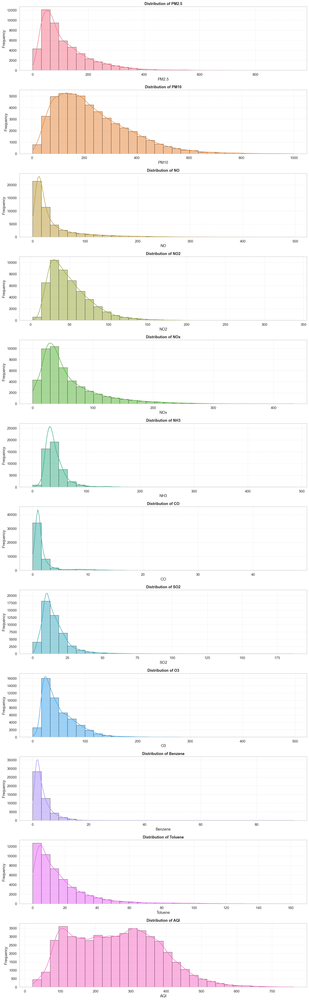

In [221]:
# Select numeric columns
numeric_cols = df_delhi.select_dtypes(include='number').columns.tolist()

# Set seaborn style
sns.set(style="whitegrid", font_scale=1.1)

# Define unique color palette
colors = sns.color_palette("husl", len(numeric_cols))

# Create subplots (1 per row, narrow width)
n_rows = len(numeric_cols)
plt.figure(figsize=(15, 4 * n_rows))  # narrower width

for idx, col in enumerate(numeric_cols):
    plt.subplot(n_rows, 1, idx + 1)
    sns.histplot(
        df_delhi[col],
        kde=True,
        bins=30,
        color=colors[idx],
        edgecolor='black',
        linewidth=0.6
    )
    plt.title(f'Distribution of {col}', fontsize=13, weight='bold')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.grid(True, linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()

In [294]:
df_delhi = df_delhi.drop(["Year"], axis = 1)

### Outliers Treatment

In [219]:
# Get all numerical columns
numeric_cols = df_delhi.select_dtypes(include='number').columns.tolist()

# Replace upper outliers with upper bound for each numeric column
for col in numeric_cols:
    Q1 = df_delhi[col].quantile(0.25)
    Q3 = df_delhi[col].quantile(0.75)
    IQR = Q3 - Q1
    upper_bound = Q3 + 1.5 * IQR

    # Replace values greater than upper bound
    df_delhi[col] = np.where(df_delhi[col] > upper_bound, upper_bound, df_delhi[col])

In [358]:
df_delhi.head()

,Datetime,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,AQI_Bucket
0,2015-01-01 01:00:00,309.19125,591.481214,81.52000,41.78,150.60,27.54,3.255,3.41,54.94,9.2,48.72,456.0,Severe
1,2015-01-01 02:00:00,309.19125,591.481214,70.80000,43.46,150.60,27.72,3.255,3.88,50.53,9.2,48.72,456.0,Severe
2,2015-01-01 03:00:00,309.19125,591.481214,93.05625,41.19,141.02,28.94,3.255,2.83,19.33,9.2,38.94,456.0,Severe
3,2015-01-01 04:00:00,309.19125,591.481214,84.78000,39.55,102.84,29.30,3.255,4.33,20.08,9.2,27.53,456.0,Severe
4,2015-01-01 05:00:00,309.19125,591.481214,60.24000,37.41,80.12,30.84,3.255,6.17,16.00,9.2,21.99,456.0,Severe


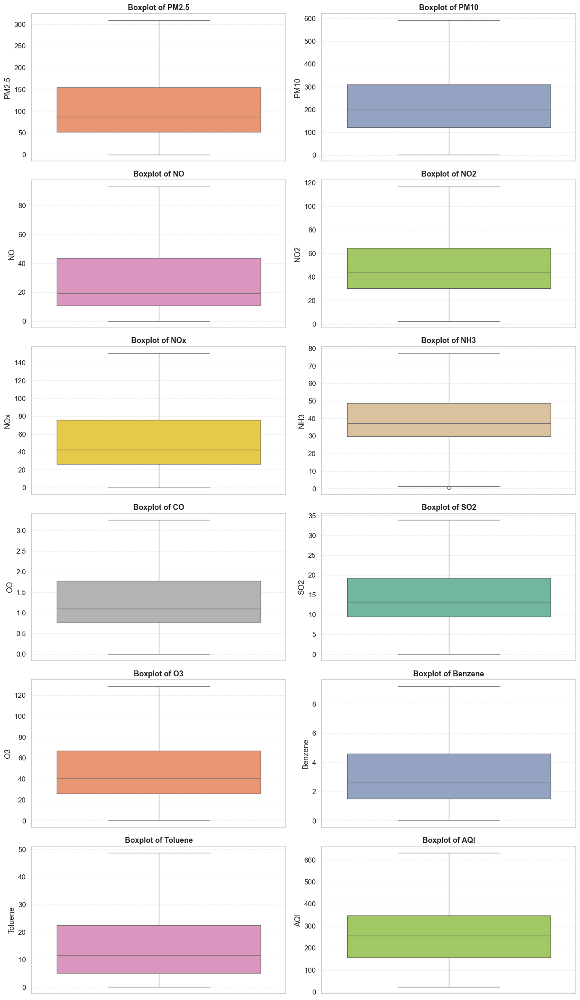

In [278]:
# Get all numerical columns (excluding 'Year' if already exists)
numeric_cols = df_delhi.select_dtypes(include='number').columns.tolist()
numeric_cols = [col for col in numeric_cols if col != 'Year']

# Set seaborn style
sns.set(style="whitegrid", font_scale=1.1)

# Define subplot layout
n_cols = 2
n_rows = int(np.ceil(len(numeric_cols) / n_cols))

# Create subplots
plt.figure(figsize=(14, n_rows * 4))

for idx, col in enumerate(numeric_cols, 1):
    plt.subplot(n_rows, n_cols, idx)
    sns.boxplot(y=df_delhi[col], color=sns.color_palette("Set2")[idx % len(sns.color_palette("Set2"))])
    plt.title(f'Boxplot of {col}', fontsize=13, weight='bold')
    plt.ylabel(col)
    plt.grid(axis='y', linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()

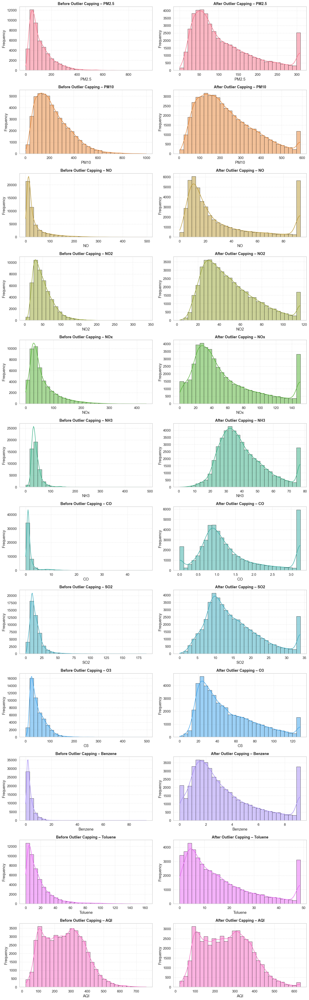

In [274]:
# 1. Create a capped version of the data using IQR method
df_capped = df_delhi.copy()
numeric_cols = df_capped.select_dtypes(include='number').columns.tolist()

for col in numeric_cols:
    Q1 = df_capped[col].quantile(0.25)
    Q3 = df_capped[col].quantile(0.75)
    IQR = Q3 - Q1
    upper_bound = Q3 + 1.5 * IQR
    df_capped[col] = np.where(df_capped[col] > upper_bound, upper_bound, df_capped[col])

# 2. Set style and palette
sns.set(style="whitegrid", font_scale=1.1)
colors = sns.color_palette("husl", len(numeric_cols))

# 3. Define subplot layout
n_rows = len(numeric_cols)
plt.figure(figsize=(15, 4 * n_rows))

# 4. Plot side-by-side distribution plots (original vs capped)
for idx, col in enumerate(numeric_cols):
    # Original
    plt.subplot(n_rows, 2, 2 * idx + 1)
    sns.histplot(df_delhi[col], kde=True, bins=30, color=colors[idx], edgecolor='black', linewidth=0.6)
    plt.title(f'Before Outlier Capping – {col}', fontsize=13, weight='bold')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.grid(True, linestyle='--', alpha=0.4)

    # After (capped)
    plt.subplot(n_rows, 2, 2 * idx + 2)
    sns.histplot(df_capped[col], kde=True, bins=30, color=colors[idx], edgecolor='black', linewidth=0.6)
    plt.title(f'After Outlier Capping – {col}', fontsize=13, weight='bold')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.grid(True, linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()

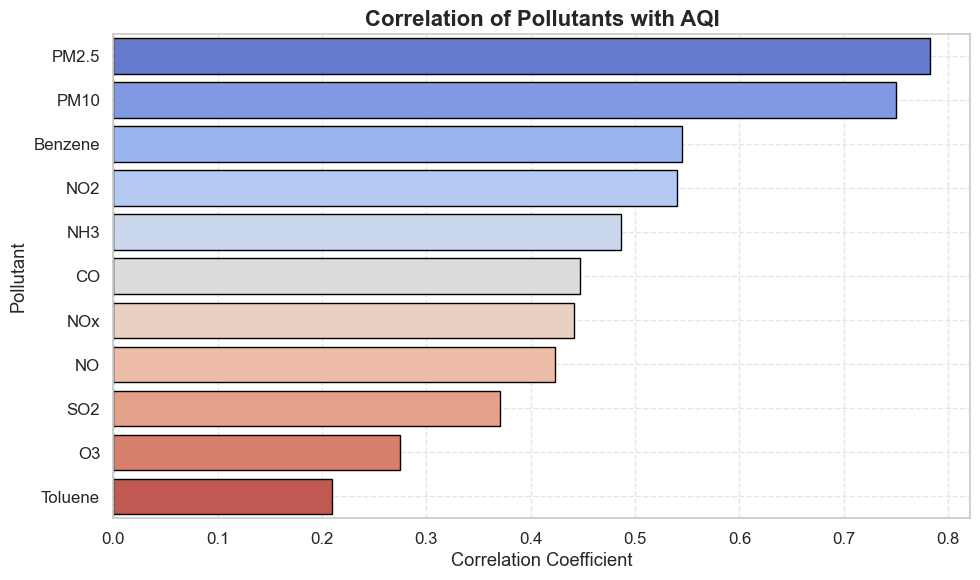

In [280]:
# Compute correlation matrix
corr_matrix = df_delhi.corr(numeric_only = True)

# Extract correlation of each pollutant with AQI
aqi_corr = corr_matrix['AQI'].drop("AQI").sort_values(ascending=False)

# Plotting setup
sns.set(style='whitegrid', font_scale=1.1)
plt.figure(figsize=(10, 6))

# Bar plot of AQI correlations
sns.barplot(x=aqi_corr.values, y=aqi_corr.index, palette='coolwarm', edgecolor='black')

# Formatting
plt.title('Correlation of Pollutants with AQI', fontsize=16, weight='bold')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Pollutant')
plt.grid(True, linestyle='--', alpha=0.5)
plt.axvline(0, color='gray', linestyle='--', linewidth=1)
plt.tight_layout()
plt.show()

In [282]:
df_delhi.columns

Index(['Datetime', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2',
       'O3', 'Benzene', 'Toluene', 'AQI', 'AQI_Bucket'],
      dtype='object')

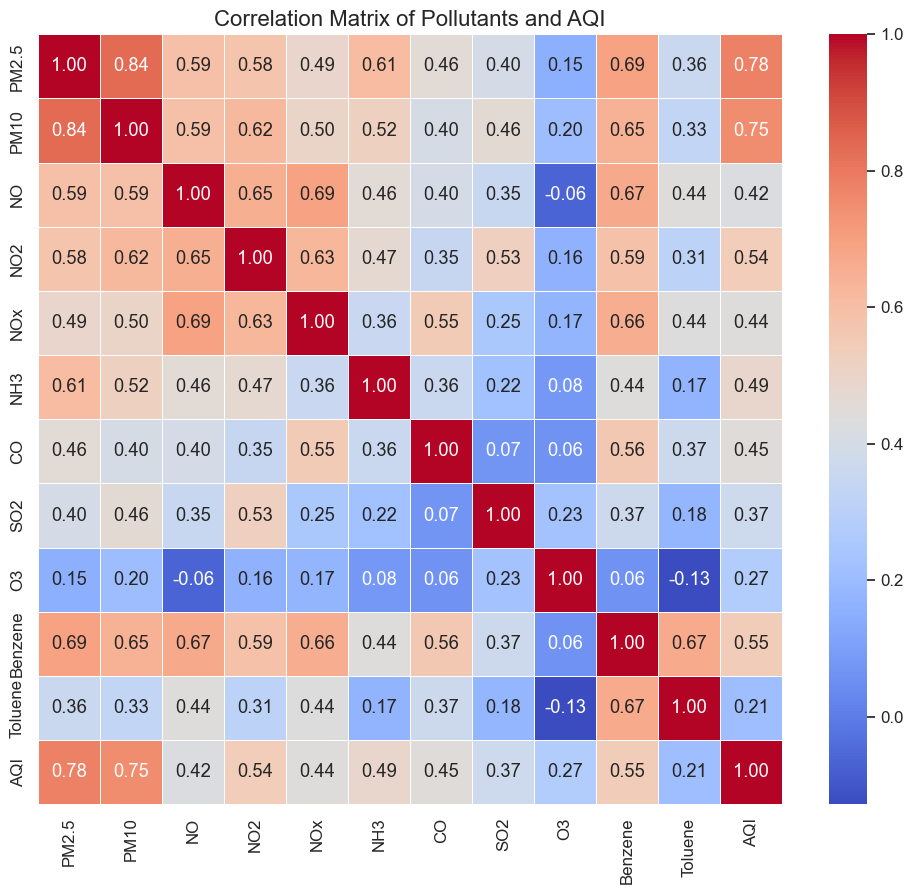

In [286]:
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Matrix of Pollutants and AQI", fontsize=16)
plt.show()

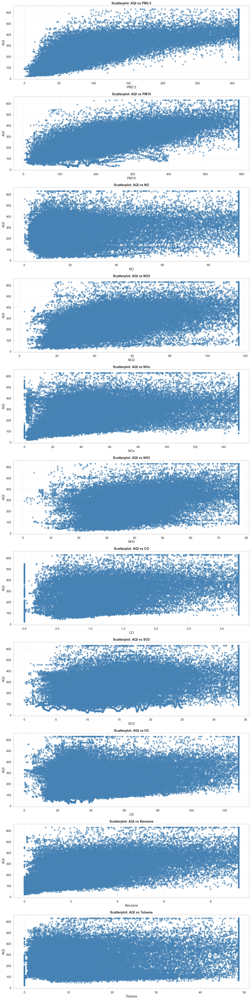

In [25]:
# Get all numeric columns except 'AQI'
numeric_cols = df_delhi.select_dtypes(include='number').columns.tolist()
numeric_cols = [col for col in numeric_cols if col != 'AQI']

# Set Seaborn theme
sns.set(style="whitegrid", font_scale=1.1)

# Define subplot layout
n_cols = 1
n_rows = int(np.ceil(len(numeric_cols) / n_cols))

plt.figure(figsize=(14, 5 * n_rows))

for idx, col in enumerate(numeric_cols):
    plt.subplot(n_rows, n_cols, idx + 1)
    sns.scatterplot(data=df_delhi, x=col, y='AQI', color='steelblue', alpha=0.6, edgecolor=None)
    plt.title(f'Scatterplot: AQI vs {col}', fontsize=13, weight='bold')
    plt.xlabel(col)
    plt.ylabel('AQI')
    plt.grid(True, linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()

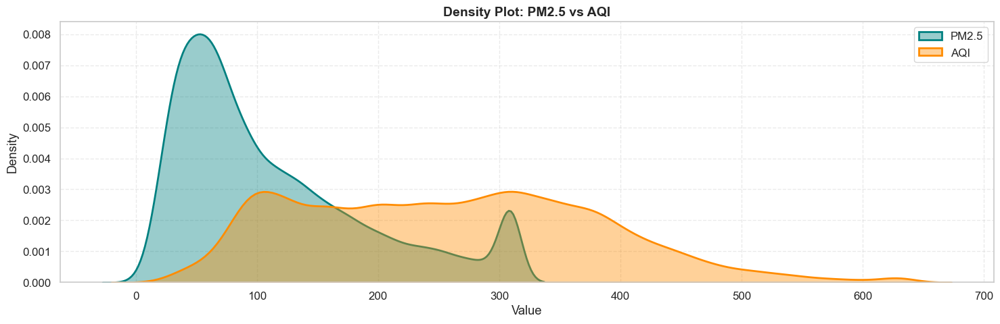

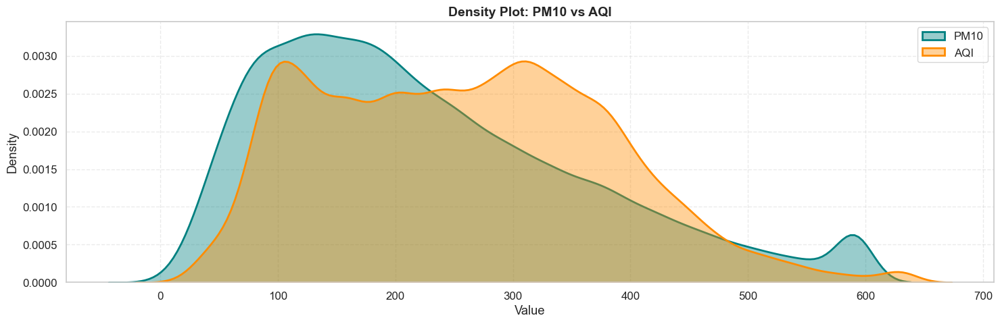

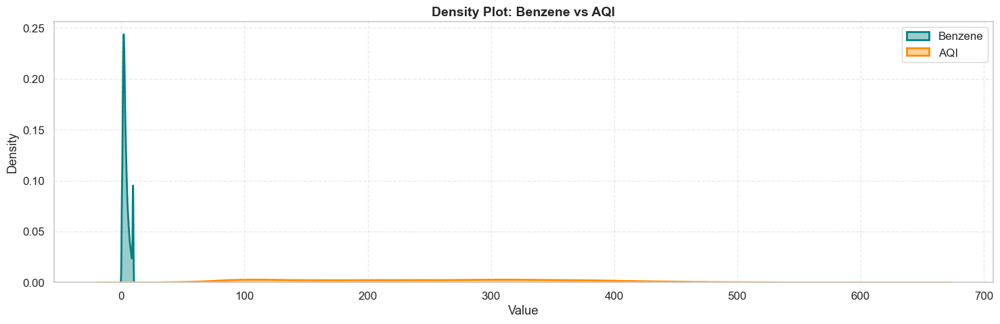

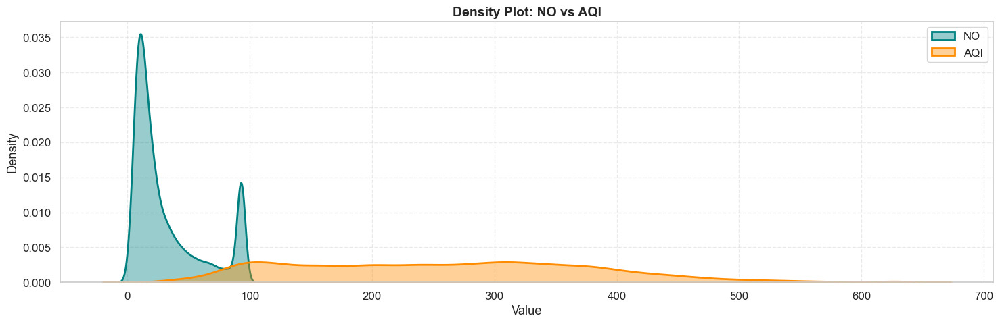

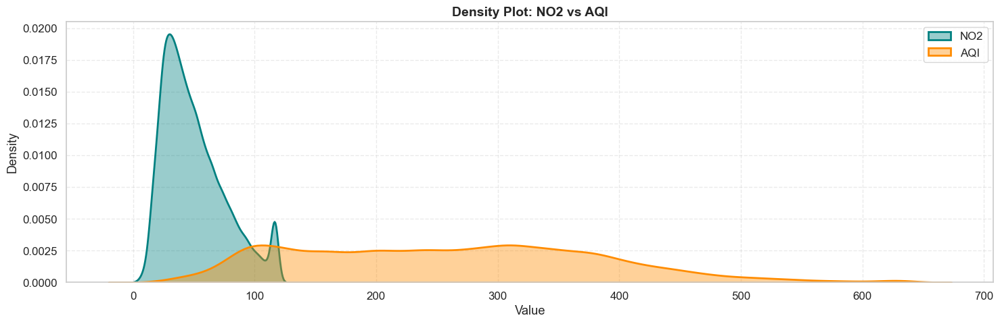

...

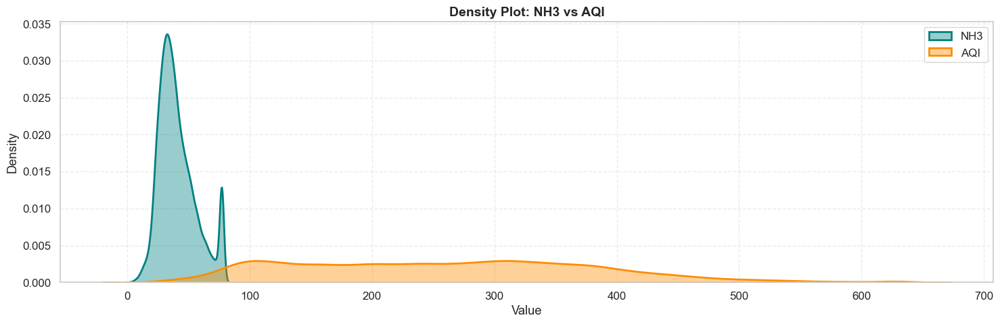

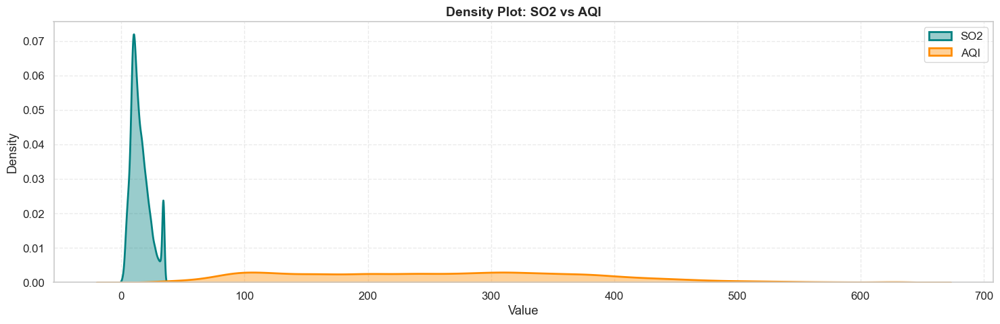

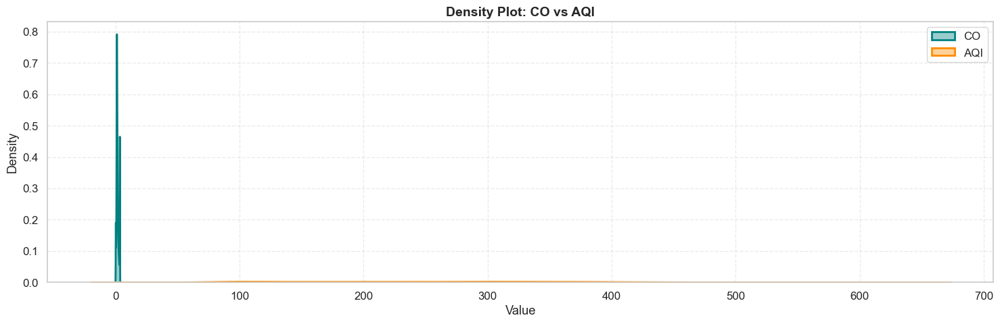

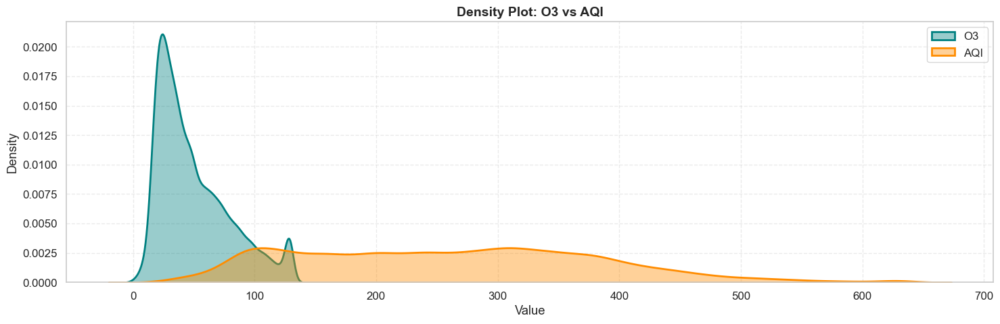

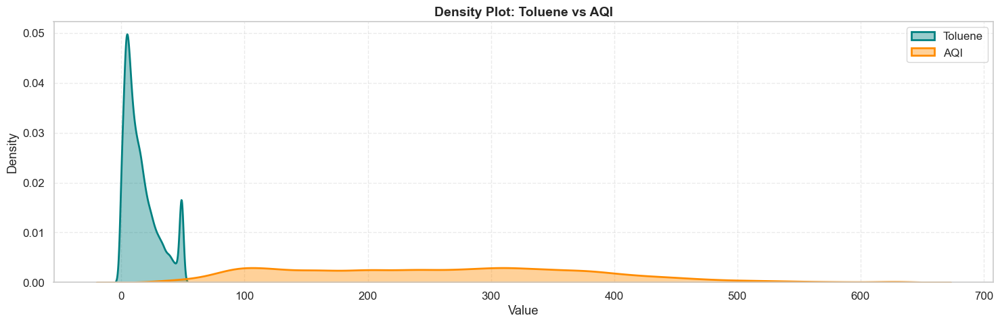

In [288]:
# Define pollutants to compare with AQI
pollutants = ['PM2.5', 'PM10', 'Benzene','NO', 'NO2', 'NOx', 'NH3', 'SO2','CO', 'O3', 'Toluene']  # customize if needed

# Set seaborn style
sns.set(style='whitegrid', font_scale=1.1)

# Plot AQI vs each pollutant in overlaid density plots
for pollutant in pollutants:
    if pollutant in df_delhi.columns:
        plt.figure(figsize=(15, 5))
        
        # Plot pollutant KDE
        sns.kdeplot(
            data=df_delhi,
            x=pollutant,
            label=pollutant,
            color='teal',
            fill=True,
            linewidth=2,
            alpha=0.4
        )

        # Plot AQI KDE on same axis for comparison
        sns.kdeplot(
            data=df_delhi,
            x='AQI',
            label='AQI',
            color='darkorange',
            fill=True,
            linewidth=2,
            alpha=0.4
        )

        plt.title(f'Density Plot: {pollutant} vs AQI', fontsize=14, weight='bold')
        plt.xlabel('Value')
        plt.ylabel('Density')
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.4)
        plt.tight_layout()
        plt.show()

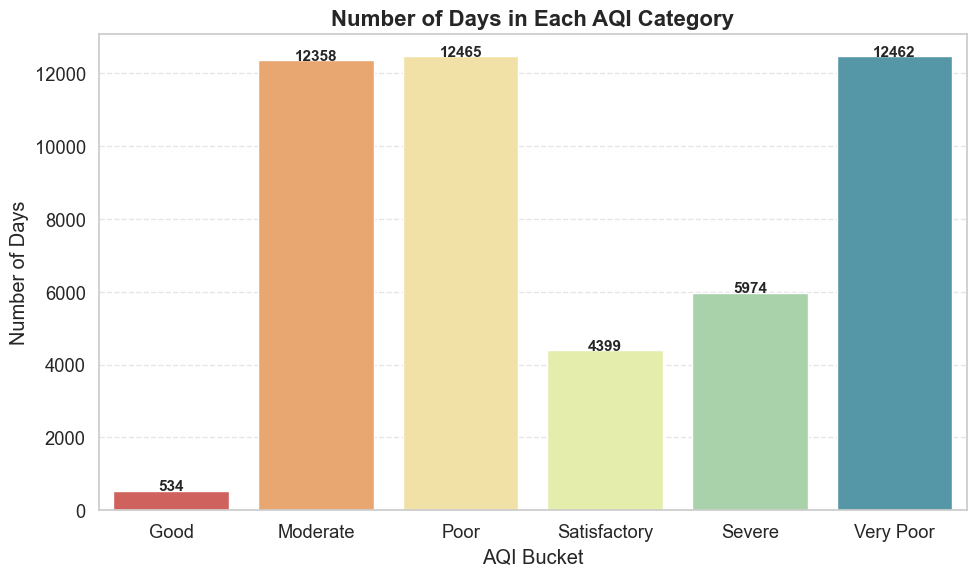

In [290]:
# Count occurrences of each AQI_Bucket
bucket_counts = df_delhi['AQI_Bucket'].value_counts().sort_index()

# Set seaborn style
sns.set(style="whitegrid", font_scale=1.2)
plt.figure(figsize=(10, 6))

# Plot the bar chart
sns.barplot(x=bucket_counts.index, y=bucket_counts.values, palette='Spectral')

# Add labels
plt.title('Number of Days in Each AQI Category', fontsize=16, weight='bold')
plt.xlabel('AQI Bucket')
plt.ylabel('Number of Days')
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Show counts on top of bars
for i, value in enumerate(bucket_counts.values):
    plt.text(i, value + 5, str(value), ha='center', fontsize=11, weight='bold')

plt.tight_layout()
plt.show()

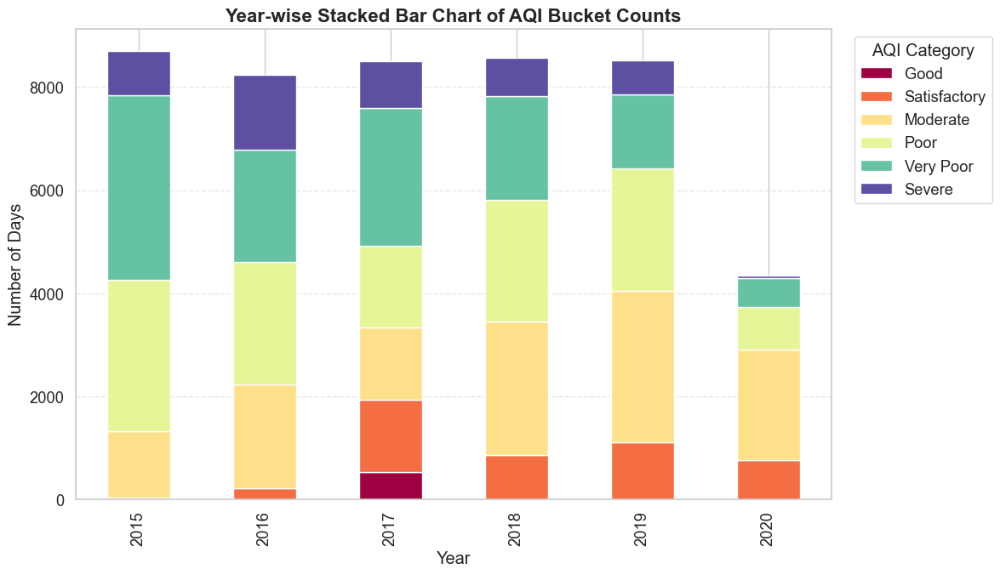

In [292]:
df_delhi['Datetime'] = pd.to_datetime(df_delhi['Datetime'])
df_delhi['Year'] = df_delhi['Datetime'].dt.year

# Define AQI_Bucket with proper categorical order
bucket_order = ['Good', 'Satisfactory', 'Moderate', 'Poor', 'Very Poor', 'Severe']
df_delhi['AQI_Bucket'] = pd.cut(
    df_delhi['AQI'],
    bins=[0, 50, 100, 200, 300, 400, 500],
    labels=bucket_order,
    ordered=True
)

# Create a pivot table: rows = year, columns = AQI_Bucket, values = count
bucket_year_counts = df_delhi.pivot_table(
    index='Year',
    columns='AQI_Bucket',
    values='AQI',
    aggfunc='count',
    fill_value=0
)

# Reorder columns to match proper AQI bucket order
bucket_year_counts = bucket_year_counts[bucket_order]

# Plot the stacked bar chart
bucket_year_counts.plot(
    kind='bar',
    stacked=True,
    figsize=(12, 7),
    colormap='Spectral'
)

# Formatting
plt.title('Year-wise Stacked Bar Chart of AQI Bucket Counts', fontsize=16, weight='bold')
plt.xlabel('Year')
plt.ylabel('Number of Days')
plt.legend(title='AQI Category', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

## Checking for Stationarity

In [296]:
from statsmodels.tsa.stattools import adfuller

# Perform the Augmented Dickey-Fuller Test
adf_test = adfuller(df_delhi["AQI"])

print('ADF Test Results')
print(f'ADF Statistic: {round(adf_test[0],3)}')
print(f'p-value: {round(adf_test[1],3)}')
print('Critical Values:')
for key, value in adf_test[4].items():
    print(f' {key}: {round(value,3)}')

ADF Test Results
ADF Statistic: -8.512
p-value: 0.0
Critical Values:
 1%: -3.43
 5%: -2.862
 10%: -2.567


In [298]:
from statsmodels.tsa.stattools import kpss

# Perform the KPSS Test
kpss_test = kpss(df_delhi["AQI"], regression = 'ct') # 'c' for constant (level ststionarity), 'ct' for trend

print('KPSS Test Results')
print(f'KPSS Statistic: {round(kpss_test[0],2)}')
print(f'p-value: {kpss_test[1]}')
print('Critical Values:')
for key, value in kpss_test[3].items():
    print(f' {key}: {value}')

KPSS Test Results
KPSS Statistic: 0.24
p-value: 0.01
Critical Values:
 10%: 0.119
 5%: 0.146
 2.5%: 0.176
 1%: 0.216


C:\Users\rbhat\AppData\Local\Temp\ipykernel_16208\367096216.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_test = kpss(df_delhi["AQI"], regression = 'ct') # 'c' for constant (level ststionarity), 'ct' for trend


In [300]:
from scipy.stats import ks_2samp
# Function to split the series into two halves and perform the K-S Test
def ks_test_stationarity(series):
    split = len(series) // 2
    series_first_half = series[:split]
    series_second_half = series[split:]
    stat, p_value = ks_2samp(series_first_half, series_second_half)
    return stat, p_value

# Perform KS Test
ks_stat_strict, ks_pvalue_strict = ks_test_stationarity(df_delhi["AQI"])

In [302]:
print(f'KS Test Statistics: {ks_stat_strict}, p-value: {round(ks_pvalue_strict,4)}')

KS Test Statistics: 0.1677871845949535, p-value: 0.0


Clearly here AQI is weakly stationary

In [304]:
# Using a moving average to remove trend

window = 30 # example window size
aqi_ma = df_delhi['AQI'].rolling(window = window).mean()
aqi_detrend = df_delhi['AQI'] - aqi_ma
aqi_detrend = aqi_detrend.dropna()

In [306]:
# Perform KS Test
ks_stat_strict, ks_pvalue_strict = ks_test_stationarity(aqi_detrend)
print(f'KS Test Statistics: {ks_stat_strict}, p-value: {round(ks_pvalue_strict,4)}')

KS Test Statistics: 0.058311779534067826, p-value: 0.0


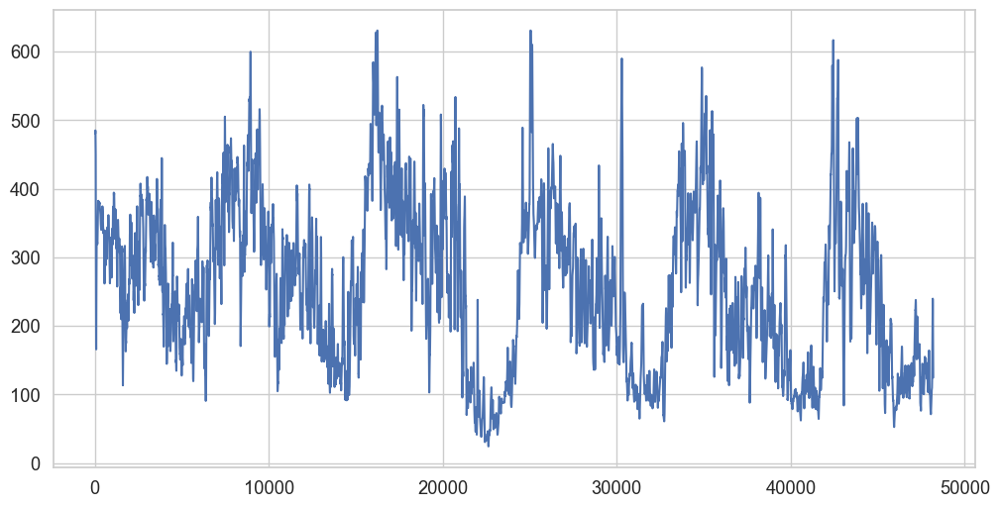

In [310]:
plt.figure(figsize=(12, 6))
#plt.plot(np.arange(len(df_delhi['AQI'])), df_delhi['AQI'])
plt.plot(np.arange(len(df_delhi['AQI'])), aqi_ma)
plt.show()

In [89]:
from statsmodels.stats.diagnostic import acorr_ljungbox

# Ljung-Box Test
print("\nLjung-Box Test:")
lb_test =acorr_ljungbox(df_delhi["AQI"], lags = [10], return_df = True)
print(lb_test)


Ljung-Box Test:
          lb_stat  lb_pvalue
10  458396.524669        0.0


Hence its a Random Walk, not a white noise. Therefore it is predicatble.

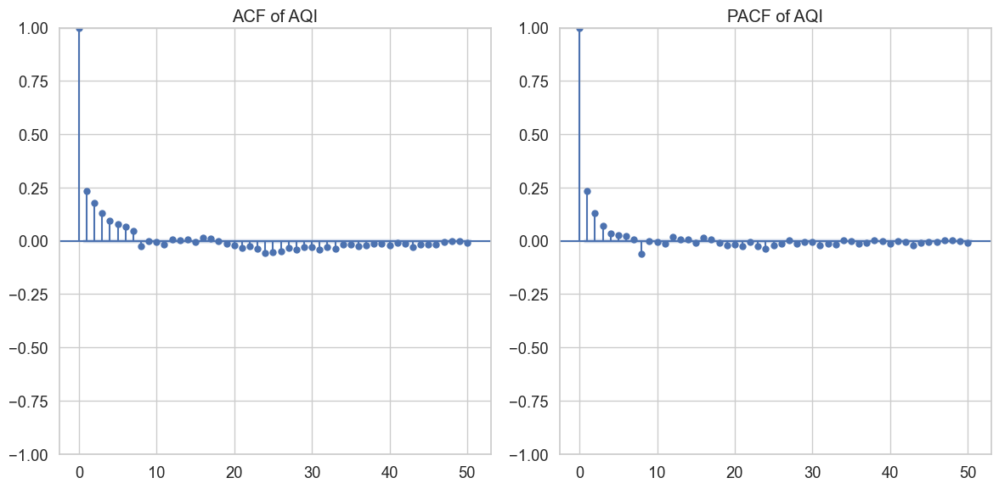

In [320]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.figure(figsize = (12,6))

# ACF Plot
plt.subplot(1,2,1)
plot_acf(aqi_stationary, ax = plt.gca(), lags = 50)
plt.title('ACF of AQI')

# PACF Plot
plt.subplot(1,2,2)
plot_pacf(aqi_stationary, ax = plt.gca(), lags = 50, method = 'ywm')
plt.title('PACF of AQI')

plt.tight_layout()
plt.show()

In [312]:
df_delhi.set_index('Datetime', inplace = True)

In [314]:
# Making data stationary before model fitting
aqi_stationary = df_delhi['AQI'].diff().dropna()

# Split the data into training and testing datasets
train_data, test_data = aqi_stationary[:-10000], aqi_stationary[-10000:]

In [316]:
adf_test = adfuller(aqi_stationary)

print('ADF Test Results')
print(f'ADF Statistic: {round(adf_test[0],3)}')
print(f'p-value: {round(adf_test[1],3)}')
print('Critical Values:')
for key, value in adf_test[4].items():
    print(f' {key}: {round(value,3)}')

ADF Test Results
ADF Statistic: -36.291
p-value: 0.0
Critical Values:
 1%: -3.43
 5%: -2.862
 10%: -2.567


In [318]:
kpss_test = kpss(aqi_stationary, regression = 'ct') # 'c' for constant (level ststionarity), 'ct' for trend

print('KPSS Test Results')
print(f'KPSS Statistic: {round(kpss_test[0],2)}')
print(f'p-value: {kpss_test[1]}')
print('Critical Values:')
for key, value in kpss_test[3].items():
    print(f' {key}: {value}')

KPSS Test Results
KPSS Statistic: 0.0
p-value: 0.1
Critical Values:
 10%: 0.119
 5%: 0.146
 2.5%: 0.176
 1%: 0.216


C:\Users\rbhat\AppData\Local\Temp\ipykernel_16208\340768627.py:1: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_test = kpss(aqi_stationary, regression = 'ct') # 'c' for constant (level ststionarity), 'ct' for trend


In [322]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

C:\Users\rbhat\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
C:\Users\rbhat\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
C:\Users\rbhat\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
C:\Users\rbhat\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


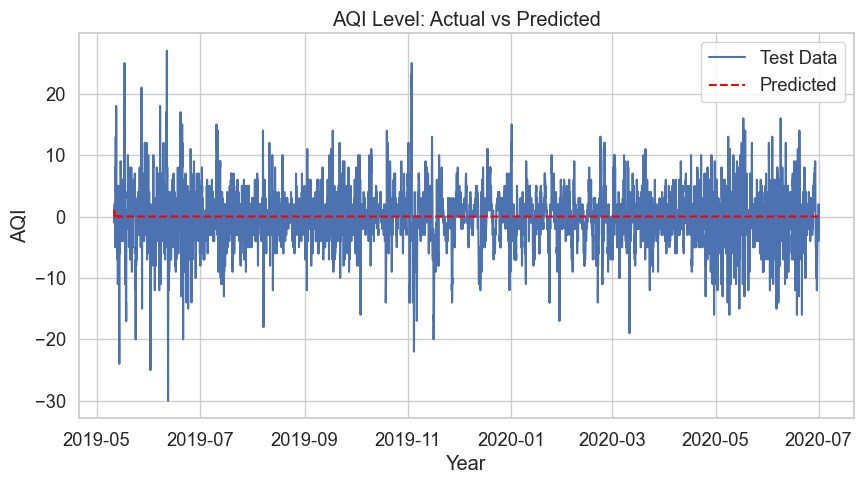

RMSE: 3.96


In [324]:
# Fit the AutoRegressive Integrated Moving Average (ARIMA) model to the training data
model = ARIMA(train_data, order = (10,1,6))
model_fit = model.fit()

# Make Predictions on the test data
predictions = model_fit.predict(
    start = len(train_data),
    end = len(train_data) + len(test_data) - 1,
    dynamic = False
)

# Plot the actual vs predicted values
plt.figure(figsize = (10,5))
plt.plot(test_data.index, test_data, label = 'Test Data')
plt.plot(test_data.index, predictions, color = 'red', linestyle = '--', label = 'Predicted')
plt.title('AQI Level: Actual vs Predicted')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.show()

# Evaluating model using RMSE score
rmse = round(np.sqrt(mean_squared_error(test_data, predictions)), 2)
print('RMSE:', rmse)

In [111]:
df_var = df_delhi.drop(columns=['AQI_Bucket'])

In [113]:
print(df_var.isna().sum())

PM2.5      0
PM10       0
NO         0
NO2        0
NOx        0
NH3        0
CO         0
SO2        0
O3         0
Benzene    0
Toluene    0
AQI        0
dtype: int64


In [179]:
df_diff = df_var.diff().diff().dropna()

In [181]:
df_diff.shape

(48190, 12)

In [183]:
train_size = int(len(df_diff) * 0.8)
train, test = df_diff.iloc[:train_size], df_diff.iloc[train_size:]

In [185]:
from statsmodels.tsa.api import VAR
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [187]:
model = VAR(train)
lag_results = model.select_order(maxlags=20)
p_opt = lag_results.aic
print("Optimal lag (AIC):", p_opt)

C:\Users\rbhat\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)


Optimal lag (AIC): 20


In [189]:
var_model = model.fit(p_opt)
print(var_model.summary())

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Thu, 03, Jul, 2025
Time:                     22:10:05
--------------------------------------------------------------------
No. of Equations:         12.0000    BIC:                    52.9177
Nobs:                     38532.0    HQIC:                   52.4790
Log likelihood:      -1.66034e+06    FPE:                5.04522e+22
AIC:                      52.2753    Det(Omega_mle):     4.68151e+22
--------------------------------------------------------------------
Results for equation PM2.5
                 coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------
const               0.001427         0.152385            0.009           0.993
L1.PM2.5           -1.212874         0.005411         -224.163           0.000
L1.PM10             0.088595         0.003521           25.161      

In [191]:
h = len(test)
forecast_diff = var_model.forecast(train.values, steps=h)

In [193]:
forecast_diff = pd.DataFrame(forecast_diff, index=test.index, columns=train.columns)

In [195]:
last_actual = df_var.iloc[train_size - 1]
forecast_level = forecast_diff.cumsum().add(last_actual)

In [197]:
y_true = df_var['AQI'].loc[test.index]
y_pred = forecast_level['AQI']

mae = mean_absolute_error(y_true, y_pred)
rmse = mean_squared_error(y_true, y_pred, squared=False)

print(f"MAE (AQI):  {mae:.2f}")
print(f"RMSE (AQI): {rmse:.2f}")

MAE (AQI):  95.94
RMSE (AQI): 140.47


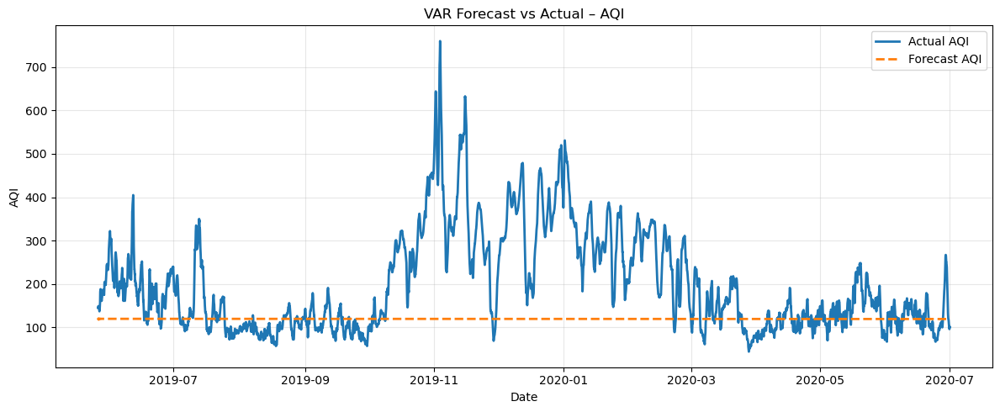

In [199]:
plt.figure(figsize=(12, 5))
plt.plot(y_true, label='Actual AQI', linewidth=2)
plt.plot(y_pred, label='Forecast AQI', linewidth=2, linestyle='--')
plt.title('VAR Forecast vs Actual – AQI')
plt.xlabel('Date')
plt.ylabel('AQI')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

## Machine Learning Models

In [221]:
df_delhi.set_index('Datetime', inplace = True)

In [29]:
df_delhi.head()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,AQI_Bucket
Datetime,,,,,,,,,,,,,
2015-01-01 01:00:00,309.19125,591.481214,81.52000,41.78,150.60,27.54,3.255,3.41,54.94,9.2,48.72,456.0,Severe
2015-01-01 02:00:00,309.19125,591.481214,70.80000,43.46,150.60,27.72,3.255,3.88,50.53,9.2,48.72,456.0,Severe
2015-01-01 03:00:00,309.19125,591.481214,93.05625,41.19,141.02,28.94,3.255,2.83,19.33,9.2,38.94,456.0,Severe
2015-01-01 04:00:00,309.19125,591.481214,84.78000,39.55,102.84,29.30,3.255,4.33,20.08,9.2,27.53,456.0,Severe
2015-01-01 05:00:00,309.19125,591.481214,60.24000,37.41,80.12,30.84,3.255,6.17,16.00,9.2,21.99,456.0,Severe


In [223]:
# Keep only numeric predictors
X = df_delhi.drop(columns=['AQI']).select_dtypes(include='number')
y = df_delhi['AQI']

In [37]:
df_delhi.shape

(48192, 13)

In [225]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False  # time‑series → no shuffling
)

In [227]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [229]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [231]:
from sklearn.decomposition import PCA
pca = PCA(n_components = None)

In [233]:
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [235]:
X_train_trf.shape

(38553, 11)

In [237]:
pca.explained_variance_.shape

(11,)

In [239]:
pca.components_.shape

(11, 11)

In [241]:
np.cumsum(pca.explained_variance_ratio_)

array([0.47565308, 0.59111467, 0.6820697 , 0.76739789, 0.83037969,
       0.87602308, 0.91853704, 0.94540851, 0.96638634, 0.98554061,
       1.        ])

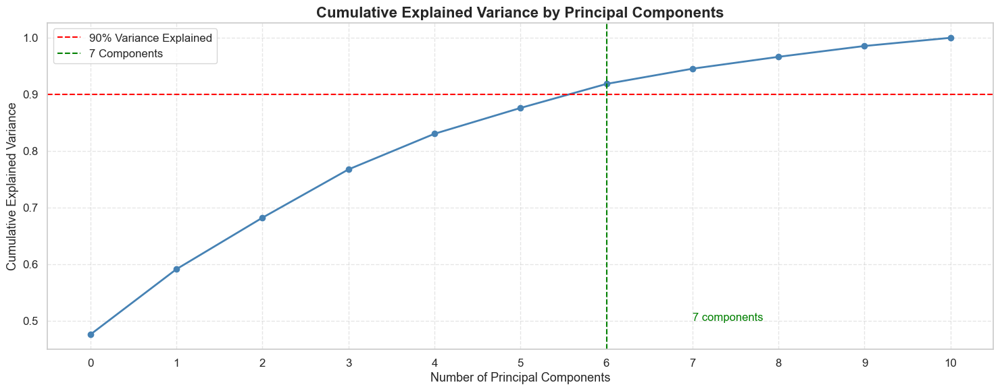

In [243]:
# Calculate cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
n_components_90 = np.argmax(cumulative_variance >= 0.90) + 1

# Plotting
plt.figure(figsize=(15, 6))
plt.plot(cumulative_variance, marker='o', linewidth=2, color='steelblue')
plt.axhline(y=0.90, color='red', linestyle='--', label='90% Variance Explained')
plt.axvline(x=n_components_90 - 1, color='green', linestyle='--', label=f'{n_components_90} Components')

# Annotation
plt.text(n_components_90, 0.5, f'{n_components_90} components', fontsize=12, color='green', ha='left')

# Aesthetics
plt.title('Cumulative Explained Variance by Principal Components', fontsize=16, weight='bold')
plt.xlabel('Number of Principal Components', fontsize=13)
plt.ylabel('Cumulative Explained Variance', fontsize=13)
plt.grid(True, linestyle='--', alpha=0.5)
plt.xticks(np.arange(0, len(cumulative_variance), step=1))
plt.legend()
plt.tight_layout()
plt.show()

In [245]:
pca = PCA(n_components = 7)

In [247]:
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

## Multiple Linear Regression

In [249]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [251]:
lr.fit(X_train_trf, y_train)

LinearRegression()

In [255]:
y_pred_lr = lr.predict(X_test_trf)

In [257]:
from sklearn.metrics import mean_absolute_error, r2_score
# R squared error
score_1 = r2_score(y_test, y_pred_lr)

# Mean Absolute Error
score_2 = mean_absolute_error(y_test, y_pred_lr)

print("R squared error: ", score_1)
print("Mean Absolute Error: ", score_2)

R squared error:  0.6766035814460851
Mean Absolute Error:  54.13236822147191


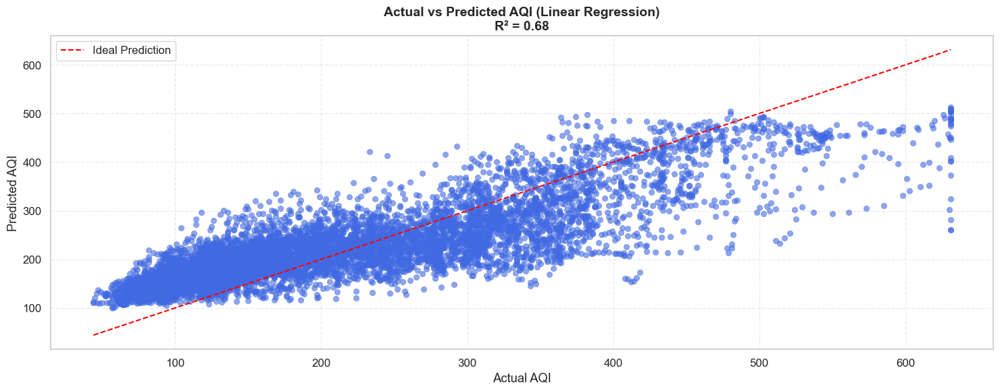

In [259]:
from sklearn.metrics import r2_score

# Assuming y_test and y_pred are already defined
r2 = r2_score(y_test, y_pred_lr)

# Set Seaborn style
sns.set(style="whitegrid", font_scale=1.1)

# Create scatterplot
plt.figure(figsize=(15, 6))
sns.scatterplot(x=y_test, y=y_pred_lr, color='royalblue', alpha=0.6, edgecolor=None)

# Add reference line y = x
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--', color='red', label='Ideal Prediction')

# Labels and title
plt.title(f'Actual vs Predicted AQI (Linear Regression)\nR² = {r2:.2f}', fontsize=14, weight='bold')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

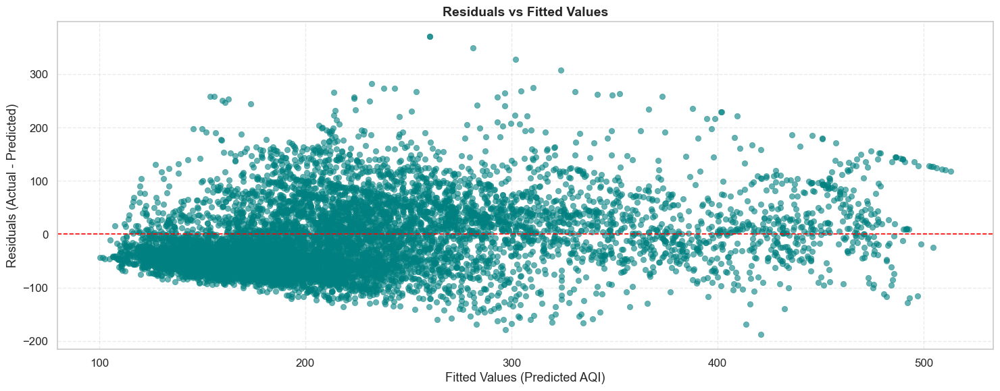

In [261]:
# Calculate residuals
residuals = y_test - y_pred_lr

# Set plot style
sns.set(style="whitegrid", font_scale=1.1)

# Create the plot
plt.figure(figsize=(15, 6))
sns.scatterplot(x=y_pred_lr, y=residuals, color='teal', alpha=0.6, edgecolor=None)

# Add horizontal line at y=0
plt.axhline(0, color='red', linestyle='--', linewidth=1.2)

# Formatting
plt.title('Residuals vs Fitted Values', fontsize=14, weight='bold')
plt.xlabel('Fitted Values (Predicted AQI)')
plt.ylabel('Residuals (Actual - Predicted)')
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

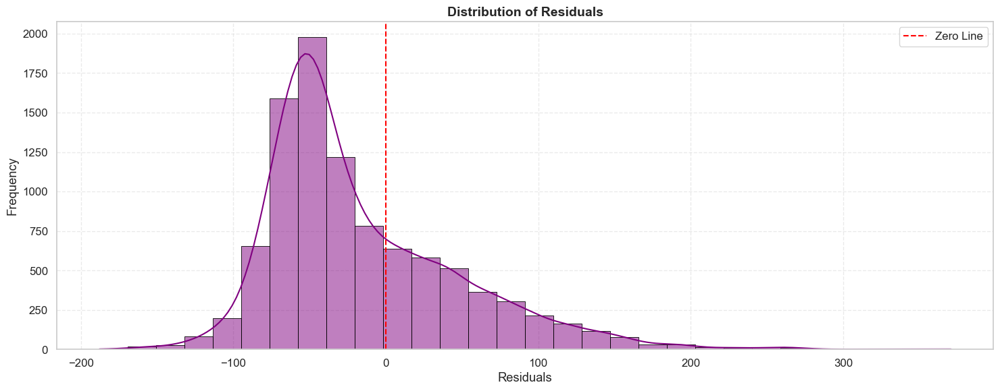

In [263]:
# Residuals (already calculated)
residuals = y_test - y_pred_lr

# Set Seaborn style
sns.set(style="whitegrid", font_scale=1.1)

# Plot histogram with KDE
plt.figure(figsize=(15, 6))
sns.histplot(residuals, kde=True, bins=30, color='purple', edgecolor='black', linewidth=0.6)

# Formatting
plt.title('Distribution of Residuals', fontsize=14, weight='bold')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.axvline(0, color='red', linestyle='--', label='Zero Line')
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()

## Decision Tree Regressor

In [265]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [267]:
param_grid = {
    'max_depth': [None, 5, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

In [269]:
dt = DecisionTreeRegressor(random_state=42)

In [271]:
grid = GridSearchCV(
    estimator=dt,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=5,
    n_jobs=-1,
    verbose=1
)

In [273]:
grid.fit(X_train_trf, y_train)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


GridSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [None, 5, 10, 20],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]},
             scoring='neg_mean_squared_error', verbose=1)

In [275]:
best_dt = grid.best_estimator_
print("Best parameters:", grid.best_params_)

Best parameters: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 2}


In [277]:
y_pred_dt = best_dt.predict(X_test_trf)

In [279]:
mae = mean_absolute_error(y_test, y_pred_dt)
rmse = mean_squared_error(y_test, y_pred_dt, squared=False)
r2 = r2_score(y_test, y_pred_dt)

print(f"Test MAE:  {mae:.2f}")
print(f"Test RMSE: {rmse:.2f}")
print(f"Test R²:   {r2:.3f}")

Test MAE:  51.27
Test RMSE: 66.86
Test R²:   0.658


In [281]:
cv_scores = cross_val_score(
    best_dt,
    X_train_trf,
    y_train,
    cv=5,
    scoring='neg_mean_squared_error'
)

In [283]:
cv_rmse_scores = np.sqrt(-cv_scores)
print(f"\nCross-Validated RMSE Scores: {cv_rmse_scores}")
print(f"Mean CV RMSE: {cv_rmse_scores.mean():.2f}")


Cross-Validated RMSE Scores: [ 85.61841749  80.91239364 106.83589358  79.21935997  82.275667  ]
Mean CV RMSE: 86.97


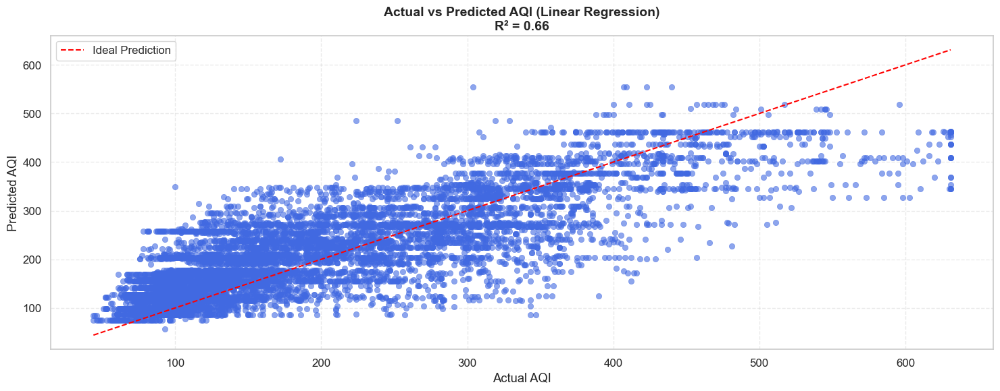

In [285]:
# Assuming y_test and y_pred are already defined
r2 = r2_score(y_test, y_pred_dt)

# Set Seaborn style
sns.set(style="whitegrid", font_scale=1.1)

# Create scatterplot
plt.figure(figsize=(15, 6))
sns.scatterplot(x=y_test, y=y_pred_dt, color='royalblue', alpha=0.6, edgecolor=None)

# Add reference line y = x
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--', color='red', label='Ideal Prediction')

# Labels and title
plt.title(f'Actual vs Predicted AQI (Linear Regression)\nR² = {r2:.2f}', fontsize=14, weight='bold')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

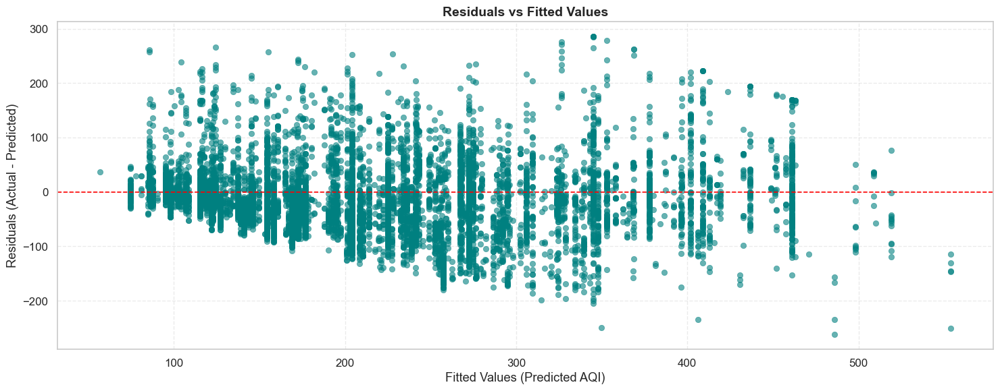

In [287]:
# Calculate residuals
residuals = y_test - y_pred_dt

# Set plot style
sns.set(style="whitegrid", font_scale=1.1)

# Create the plot
plt.figure(figsize=(15, 6))
sns.scatterplot(x=y_pred_dt, y=residuals, color='teal', alpha=0.6, edgecolor=None)

# Add horizontal line at y=0
plt.axhline(0, color='red', linestyle='--', linewidth=1.2)

# Formatting
plt.title('Residuals vs Fitted Values', fontsize=14, weight='bold')
plt.xlabel('Fitted Values (Predicted AQI)')
plt.ylabel('Residuals (Actual - Predicted)')
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

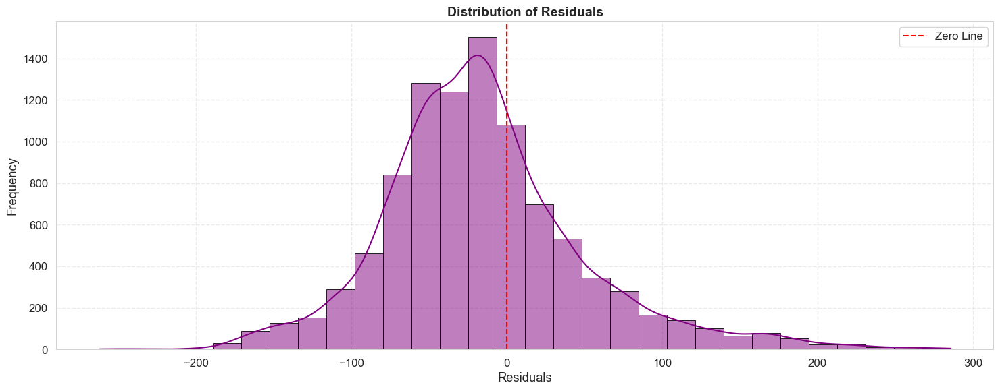

In [289]:
# Residuals (already calculated)
residuals = y_test - y_pred_dt

# Set Seaborn style
sns.set(style="whitegrid", font_scale=1.1)

# Plot histogram with KDE
plt.figure(figsize=(15, 6))
sns.histplot(residuals, kde=True, bins=30, color='purple', edgecolor='black', linewidth=0.6)

# Formatting
plt.title('Distribution of Residuals', fontsize=14, weight='bold')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.axvline(0, color='red', linestyle='--', label='Zero Line')
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()

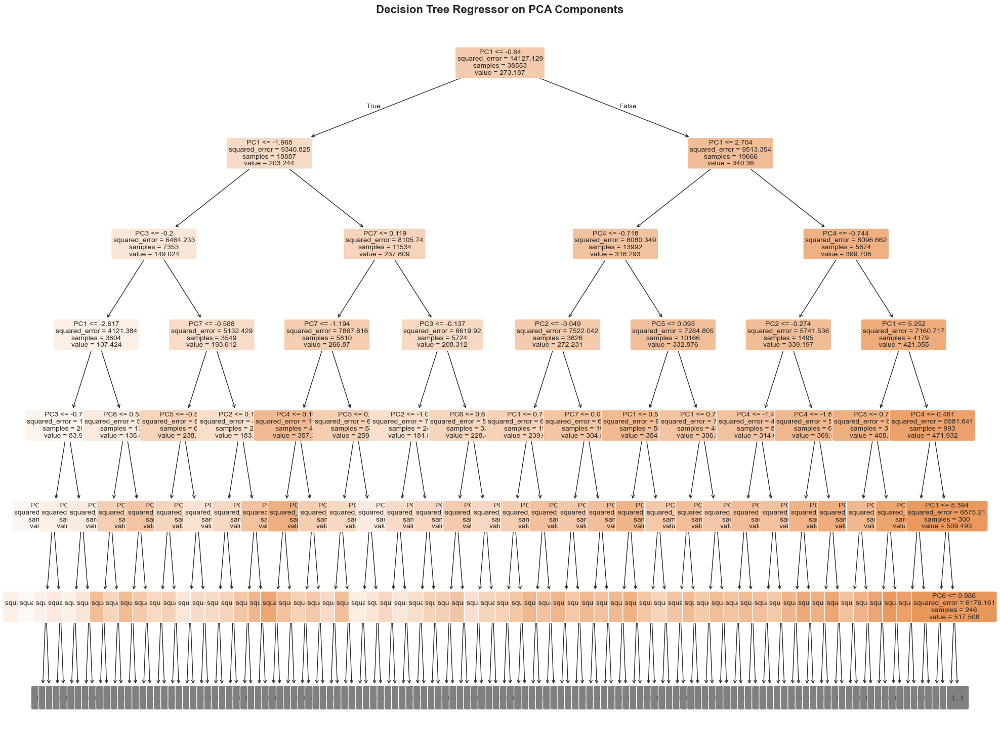

In [301]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Create generic feature names for principal components
n_components = X_train_trf.shape[1]
pc_names = [f"PC{i+1}" for i in range(n_components)]

# Plot the decision tree
plt.figure(figsize=(20, 15))
plot_tree(
    best_dt,                # your trained DecisionTreeRegressor
    feature_names=pc_names,  # generic PC names
    filled=True,
    rounded=True,
    fontsize=10,
    max_depth=6
)

plt.title("Decision Tree Regressor on PCA Components", fontsize=16, weight='bold')
plt.tight_layout()
plt.show()

## Random Forest Regressor

In [303]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [305]:
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

In [307]:
rf = RandomForestRegressor(random_state=42)

In [309]:
grid = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=5,
    n_jobs=-1,
    verbose=1
)

In [311]:
grid.fit(X_train_trf, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [None, 10, 20],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200]},
             scoring='neg_mean_squared_error', verbose=1)

In [183]:
best_rf = grid.best_estimator_
print("Best Parameters:", grid.best_params_)

Best Parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


In [185]:
y_pred = best_rf.predict(X_test_trf)

In [187]:
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f"\nTest Set Evaluation:")
print(f"MAE  : {mae:.2f}")
print(f"RMSE : {rmse:.2f}")
print(f"R²   : {r2:.3f}")


Test Set Evaluation:
MAE  : 53.35
RMSE : 69.88
R²   : 0.664


In [189]:
cv_scores = cross_val_score(
    best_rf,
    X_train_trf,
    y_train,
    cv=5,
    scoring='neg_root_mean_squared_error'
)

In [191]:
print(f"\n5-Fold CV RMSE scores: {np.round(-cv_scores, 2)}")
print(f"Mean CV RMSE: {-cv_scores.mean():.2f}")


5-Fold CV RMSE scores: [ 73.5   71.85  93.32 136.69  66.53]
Mean CV RMSE: 88.38
